## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [410]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
# %matplotlib qt

def calibrate_camera(wildcard, show=False):
    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Arrays to store object points and image points from all the images.
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # Make a list of calibration images
    images = glob.glob(wildcard)
    shape = None

    # Step through the list and search for chessboard corners
    for fname in images:
        img = cv2.imread(fname)
        gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        shape = gray.shape[::-1]

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

        # If found, add object points, image points
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)

            # Draw and display the corners
            if show:
                img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
                plt.imshow(img)
                plt.show()
                
    _, mtx, dist, _, _ = cv2.calibrateCamera(objpoints, imgpoints, shape, None, None)
    return mtx, dist

mtx, dist = calibrate_camera('../camera_cal/calibration*.jpg')

def undistort(img):
    return cv2.undistort(img, mtx, dist, None, mtx)


### Test calibration

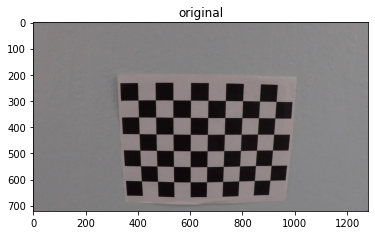

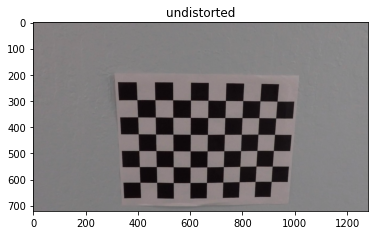

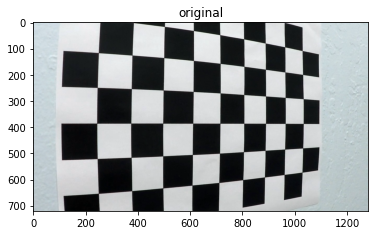

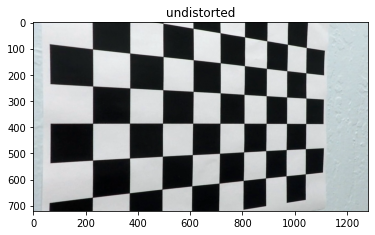

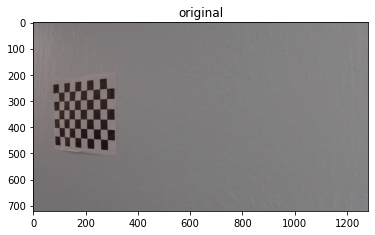

...

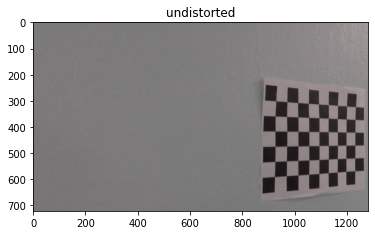

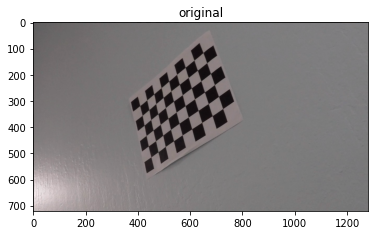

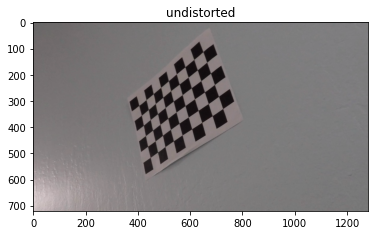

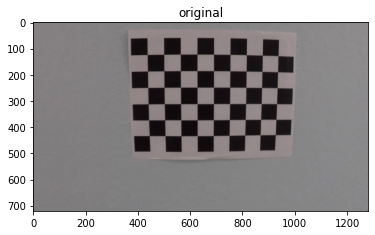

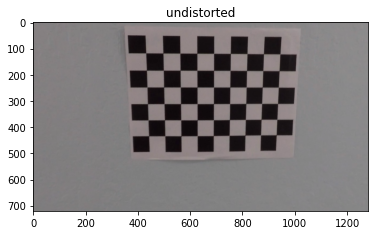

In [411]:
images = glob.glob('../camera_cal/calibration*.jpg')
for fname in images:    
    img = cv2.imread(fname)
    plt.title("original")
    plt.imshow(img)
    plt.show()

    plt.title("undistorted")
    plt.imshow(undistort(img))
    plt.show()

### Thresholded binary image

In [412]:
def saturation_image(img):
    hls = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    return hls[:,:,2]

def sobel_image(img):
    sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    return np.uint8(255*abs_sobelx/np.max(abs_sobelx))

def binary_image(img, thresh_min, thresh_max):
    binary_img = np.zeros_like(img)
    binary_img[(img >= thresh_min) & (img <= thresh_max)] = 1
    return binary_img

def combine_binary_images(img_a, img_b):
    # assumption: images have the same shape
    combined_binary = np.zeros_like(img_a)
    combined_binary[(img_a == 1) | (img_b == 1)] = 1
    return combined_binary

def grayscale(img):
    return cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

def threshold_image(img):
    sat_bin = binary_image(saturation_image(img), thresh_min=170, thresh_max=255)
    sobel_bin = binary_image(grayscale(sobel_image(img)), thresh_min=20, thresh_max=100)
    return combine_binary_images(sat_bin, sobel_bin)

## Perspective transformation

In [413]:
ox = transform_offset_x = 300
oy = transform_offset_y = 2000
w = lane_width = 370
l = stripe_length = 300

src = np.float32([[547, 489], [741, 489], [771, 510], [519, 510]])
dst = np.float32([[ox + 0, oy + 0], [ox + w, oy + 0], [ox + w, oy + l], [ox + 0, oy + l]])
M = cv2.getPerspectiveTransform(src, dst)
invM = cv2.getPerspectiveTransform(dst, src)

def top_down_transform(img):
    return cv2.warpPerspective(img, M, (800, 3000))

def inverse_top_down_transform(img, size):
    return cv2.warpPerspective(img, invM, size)

## TEST

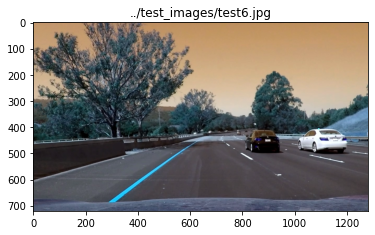

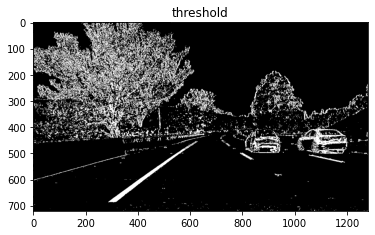

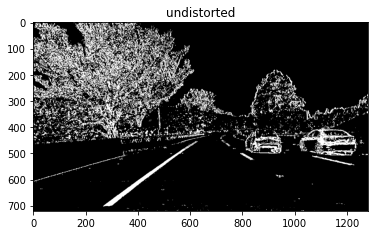

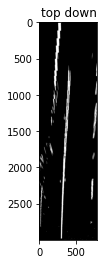

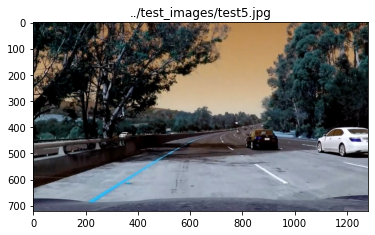

...

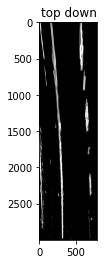

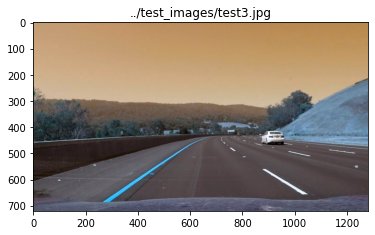

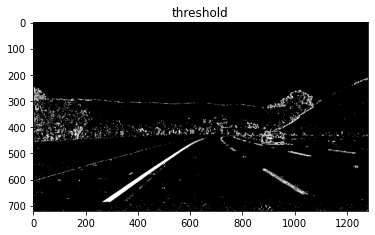

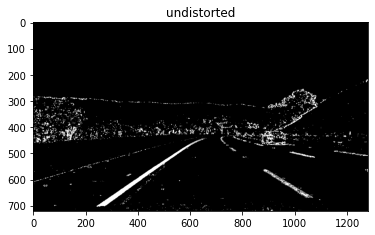

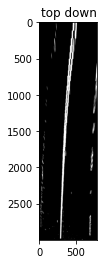

In [414]:
def test_transformation(path):
    img = cv2.imread(path)
    def show(img, title):
        plt.title(title)
        plt.imshow(img, cmap="gray")
        plt.show()
        
    show(img, path)

    thresholded = threshold_image(img)
    show(thresholded, "threshold")

    undistorted = undistort(thresholded)
    show(undistorted, "undistorted")

    topDown = top_down_transform(undistorted)
    show(topDown, "top down")
    
images = glob.glob('../test_images/*.jpg')
for fname in images:
    test_transformation(fname)


In [415]:
def transform(img):
    return topDownView(undistort(threshold_image(img)))

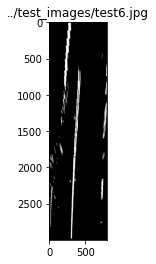

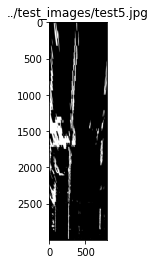

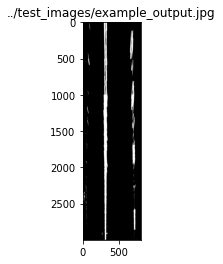

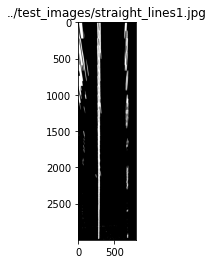

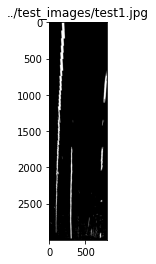

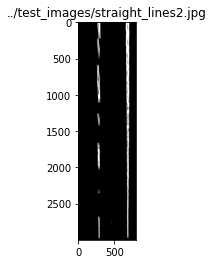

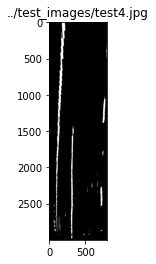

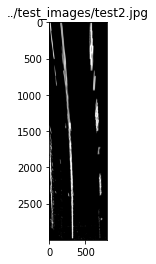

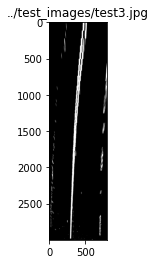

In [416]:
def test_transform(path):
    img = cv2.imread(path)
    top_down = transform(img)
    plt.title(path)
    plt.imshow(top_down, cmap='gray')
    plt.show()
    
images = glob.glob('../test_images/*.jpg')
for fname in images:
    test_transform(fname)

### Detect Lanes

In [417]:
def bottom_half_histogram(img):
    bottom_half = img[img.shape[0]//2:,:]
    return np.sum(bottom_half, axis=0)

def find_lanes_in_hist(hist):
    mid = np.int(hist.shape[0]//2)
    left = np.argmax(hist[:mid])
    right = np.argmax(hist[mid:]) + mid
    return left, right

def find_lanes(img):
    hist = bottom_half_histogram(img)
    return find_lanes_in_hist(hist)

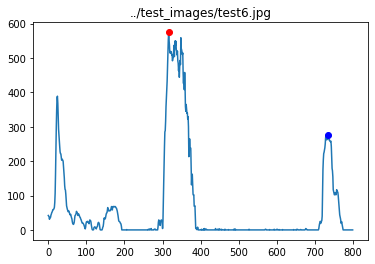

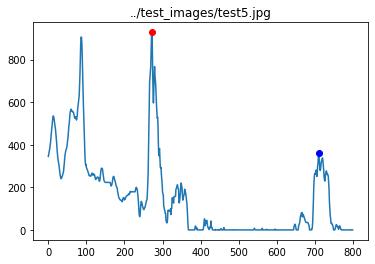

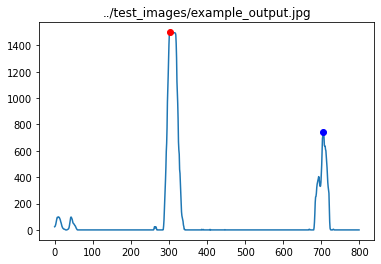

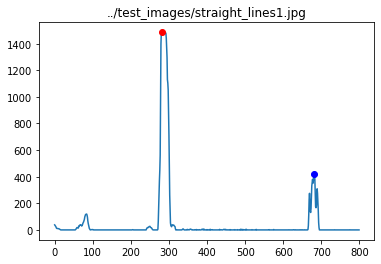

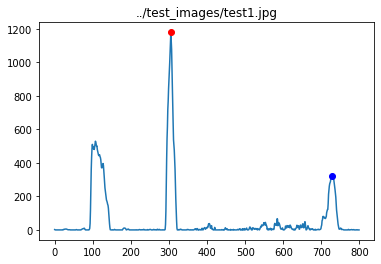

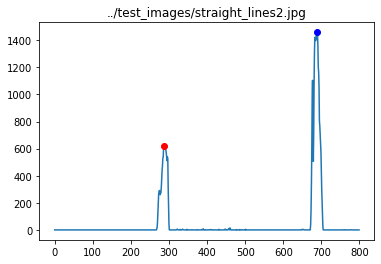

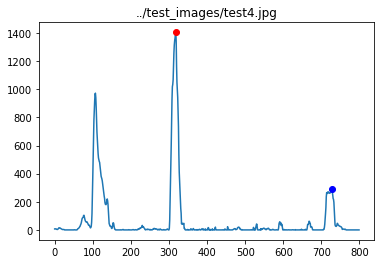

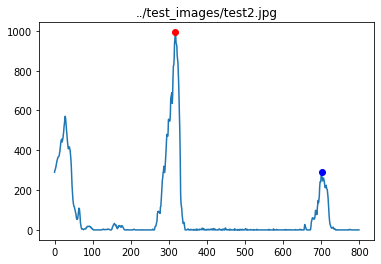

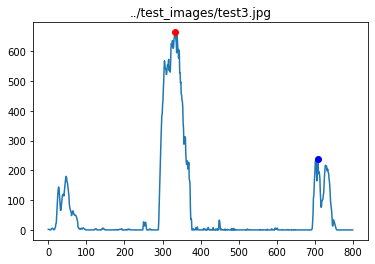

In [418]:
images = glob.glob('../test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    top_down = transform(img)
    hist = bottom_half_histogram(top_down)
    left, right = find_lanes_in_hist(hist)

    plt.title(fname)
    plt.plot(hist)
    plt.plot(left, hist[left], "ro")
    plt.plot(right, hist[right], "bo")
    
    plt.show()

In [440]:
min_pix_recenter = 30

def window_vertical_bounds(n, window_height, height):
    low = height - n * window_height
    high = low - window_height
    return low, high

def window_horizontal_bounds(center, width, margin = 40):
    return max(0, center - margin), min(width, center + margin)

def find_lane_pixels_sliding_window(img, lane_center, num_windows = 10):
    height, width = img.shape[0], img.shape[1]
    window_height = height // num_windows

    nonzero = img.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    lane_inds = []
    
    for n in range(num_windows):
        y_bottom, y_top = window_vertical_bounds(n, window_height, height)
        x_left, x_right = window_horizontal_bounds(lane_center, width)
        
        good_inds = (
            (nonzero_x > x_left)
            & (nonzero_x < x_right)
            & (nonzero_y < y_bottom)
            & (nonzero_y > y_top)
        ).nonzero()[0]

        lane_inds.append(good_inds)
        if len(good_inds) > min_pix_recenter:
            lane_center = np.int(np.mean(nonzero_x[good_inds]))
           
    # extract pixel positions
    lane_inds = np.concatenate(lane_inds)    
    lane_x = nonzero_x[lane_inds]
    lane_y = nonzero_y[lane_inds]
    return lane_x, lane_y

def find_lane_polynomial(lane_x, lane_y):    
    if len(lane_x) == 0:
        print("CANNOT FIT A POLYNOMIAL - THE LANE PIXELS ARE EMPTY")
        return [0, 0, 0]
    
    return np.polyfit(lane_y, lane_x, 2)

def find_lanes_polynomials(img):    
    left, right = find_lanes(img)
    
    lane_x, lane_y = find_lane_pixels_sliding_window(img, left)
    left_poly = find_lane_polynomial(lane_x, lane_y)
    
    lane_x, lane_y = find_lane_pixels_sliding_window(img, right)
    right_poly = find_lane_polynomial(lane_x, lane_y)

    return left_poly, right_poly

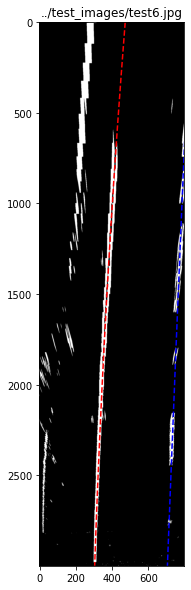

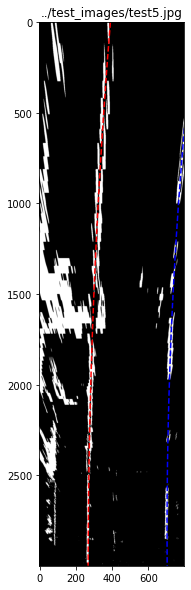

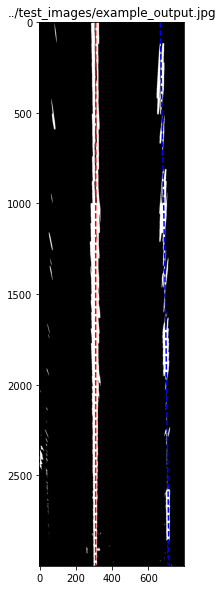

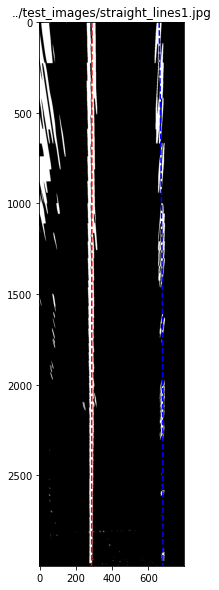

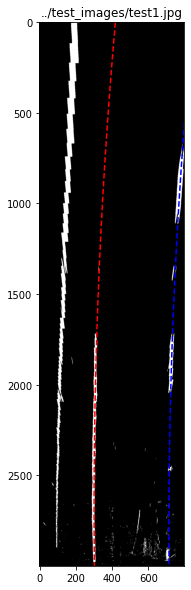

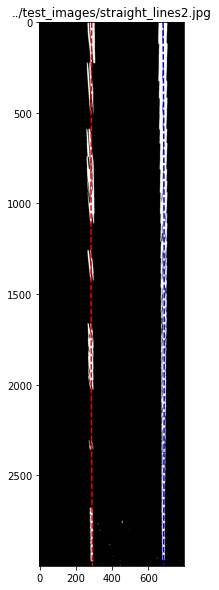

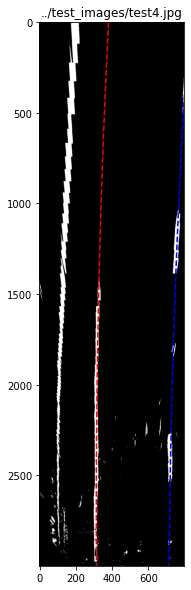

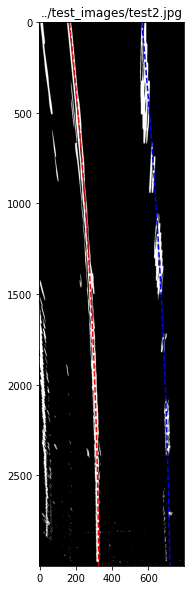

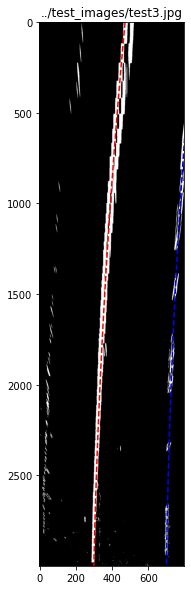

In [420]:
images = glob.glob('../test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)

    height = top_down.shape[0]
    y = np.linspace(0, height - 1, height)
    x_l = left_poly[0]*y**2 + left_poly[1]*y + left_poly[2]
    x_r = right_poly[0]*y**2 + right_poly[1]*y + right_poly[2]
    
    plt.figure(figsize=(5, 10))
    plt.title(fname)
    plt.plot(x_l, y, "r--")
    plt.plot(x_r, y, "b--")
    plt.imshow(top_down, cmap="gray")
    plt.show()

In [421]:
def eval_poly(p, height):
    y = np.linspace(0, height - 1, height)
    x = p[0] * y**2 + p[1] * y + p[2]
    return x, y

def find_lane_pixels_around_polynomial(img, poly, margin = 40):
    # find indexes of all white pixels around the previous polynomial
    nonzero = img.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    inds = (np.abs(nonzero_x - (poly[0]*(nonzero_y**2) + poly[1]*nonzero_y + poly[2])) < margin)
    
    # extract lane pixel positions
    lane_x = nonzero_x[inds]
    lane_y = nonzero_y[inds]
    return lane_x, lane_y

def find_lane_polynomial_from_prev(img, prev_poly):
    lane_x, lane_y = find_lane_pixels_around_polynomial(img, prev_poly)
    return find_lane_polynomial(lane_x, lane_y)
    
def find_lanes_polynomials_from_prev(img, prev_left_poly, prev_right_poly):
    left_poly = find_lane_polynomial_from_prev(img, prev_left_poly)
    right_poly = find_lane_polynomial_from_prev(img, prev_right_poly)
    return left_poly, right_poly

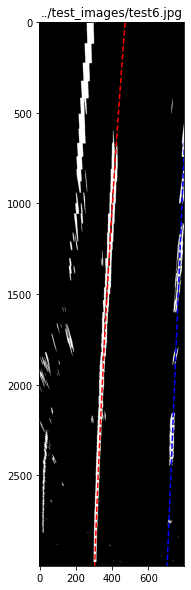

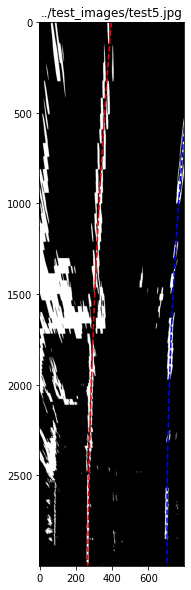

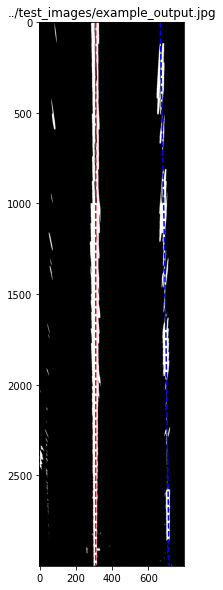

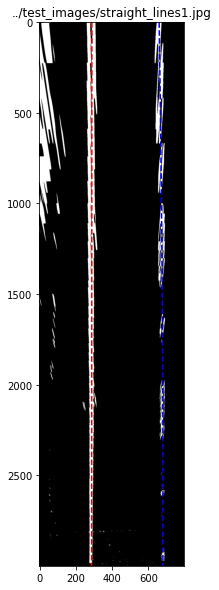

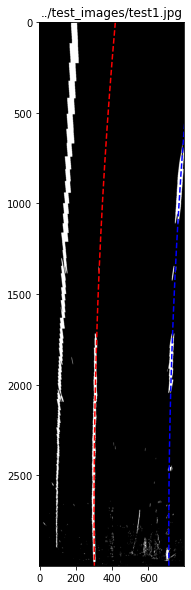

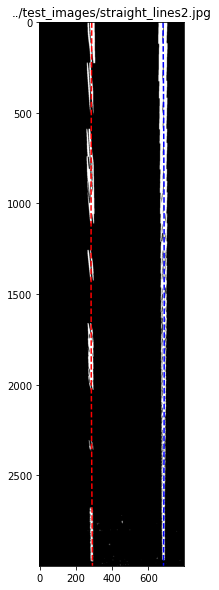

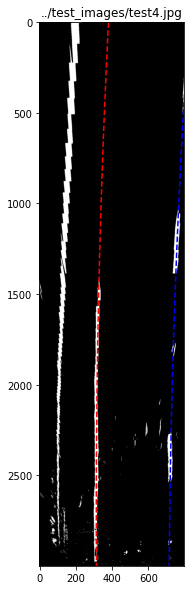

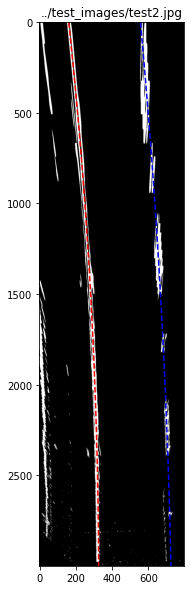

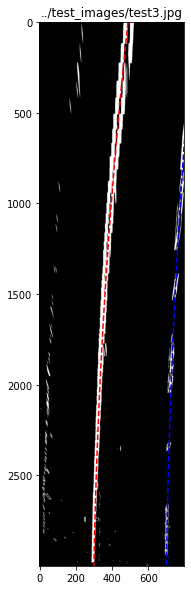

In [422]:
images = glob.glob('../test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)
    top_down = transform(img)
    prev_left_poly, prev_right_poly = find_lanes_polynomials(top_down)
    left_poly, right_poly = find_lanes_polynomials_from_prev(top_down, prev_left_poly, prev_right_poly)

    height = top_down.shape[0]
    x_l, y = eval_poly(left_poly, height)
    x_r, _ = eval_poly(right_poly, height)
    
    plt.figure(figsize=(5, 10))
    plt.title(fname)
    plt.plot(x_l, y, "r--")
    plt.plot(x_r, y, "b--")
    plt.imshow(top_down, cmap="gray")
    plt.show()

### Draw lanes onto the original image

In [423]:
red = [255, 0, 0]
green = [0, 255, 0]
blue = [0, 0, 255]

def color_pixels_along_poly(img, poly, color, margin = 40):
    lane_x, lane_y = find_lane_pixels_around_polynomial(img, poly, margin)
    zeros = np.zeros_like(img)
    out_img = np.dstack((zeros, zeros, zeros))
    out_img[lane_y, lane_x] = color
    return out_img

def color_lane_between_polys(img, left_poly, right_poly, color):
    height = img.shape[0]
    x_l, y = eval_poly(left_poly, height)
    x_r, _ = eval_poly(right_poly, height)
    
    left_bound = np.array([np.transpose(np.vstack([x_l, y]))])
    right_bound = np.array([np.flipud(np.transpose(np.vstack([x_r, y])))])
    polygon = np.hstack((left_bound, right_bound))

    zeros = np.zeros_like(img)
    out_img = np.dstack((zeros, zeros, zeros))
    cv2.fillPoly(out_img, np.int_([polygon]), color)
    return out_img
    
def draw_lanes(img, left_lane_poly, right_lane_poly):
    left_lane_marked = color_pixels_along_poly(img, left_lane_poly, color = red)
    right_lane_marked = color_pixels_along_poly(img, right_lane_poly, color = blue)
    
    zeros = np.zeros_like(img)
    out_img = np.dstack((zeros, zeros, zeros))
        
    colored_bounds = cv2.addWeighted(left_lane_marked, 1, right_lane_marked, 1, 0)
    colored_lane = color_lane_between_polys(img, left_lane_poly, right_lane_poly, green)
    return cv2.addWeighted(colored_bounds, 1, colored_lane, 0.3, 0)

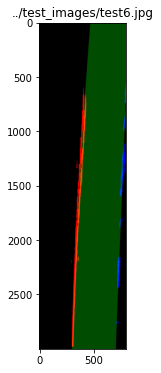

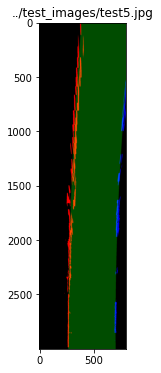

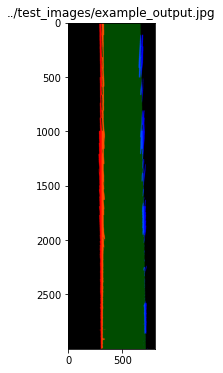

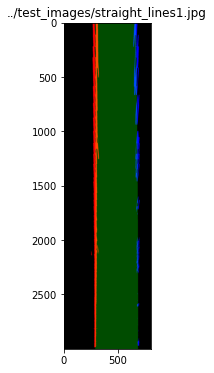

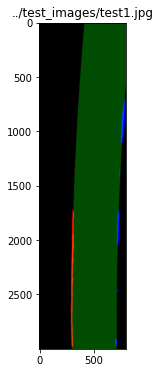

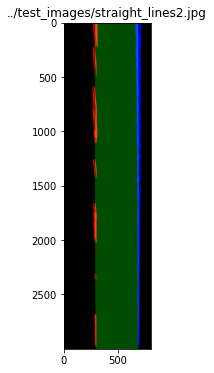

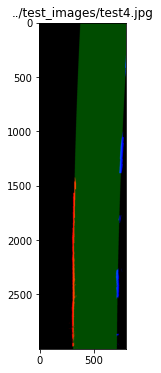

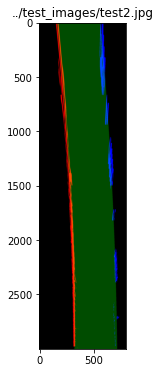

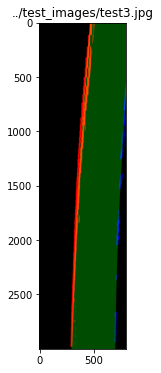

In [424]:
images = glob.glob('../test_images/*.jpg')

for fname in images:
    img = cv2.imread(fname)

    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    
    out_img = draw_lanes(top_down, left_poly, right_poly)
    
    plt.figure(figsize=(3, 6))
    plt.title(fname)
    plt.imshow(out_img)
    plt.show()

## Combine the final picture with the original picture with correct perspective transformation

In [425]:
def draw_result(orig_img, markings_img):
    height = orig_img.shape[0]
    width = orig_img.shape[1]
    size = (width, height)    
    warped_markings_img = inverse_top_down_transform(markings_img, size)
    return cv2.addWeighted(undistort(orig_img), 1, warped_markings_img, 1, 0)

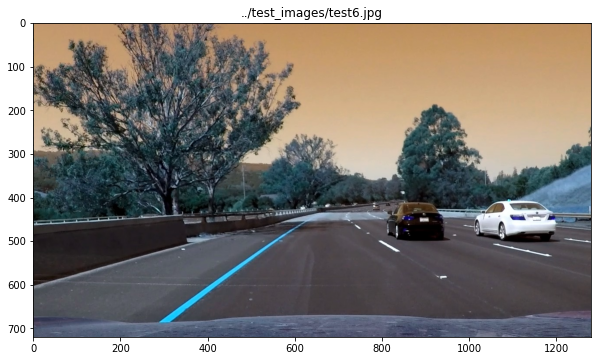

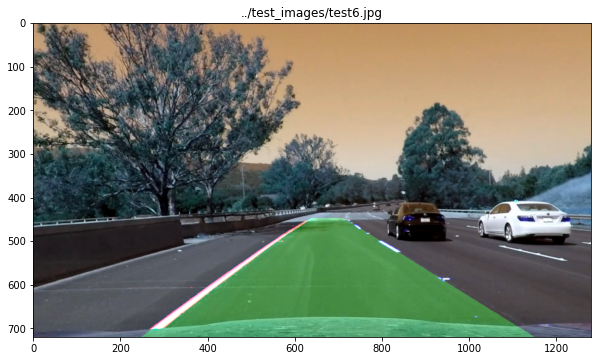

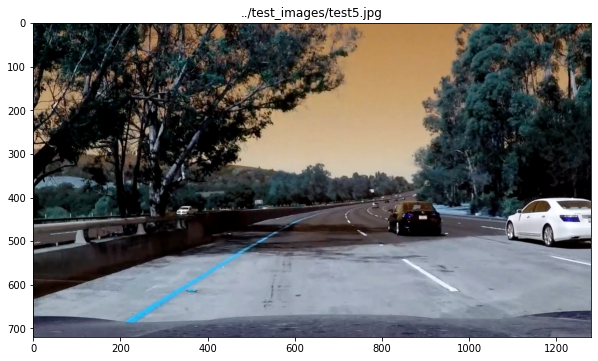

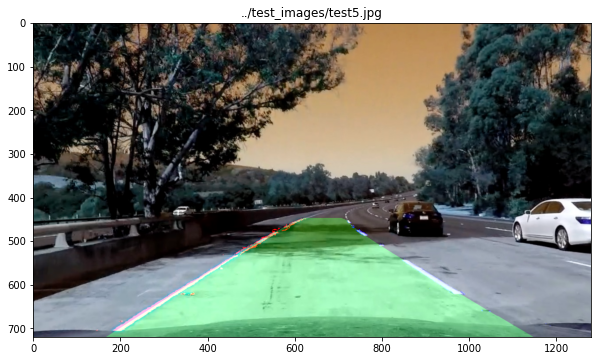

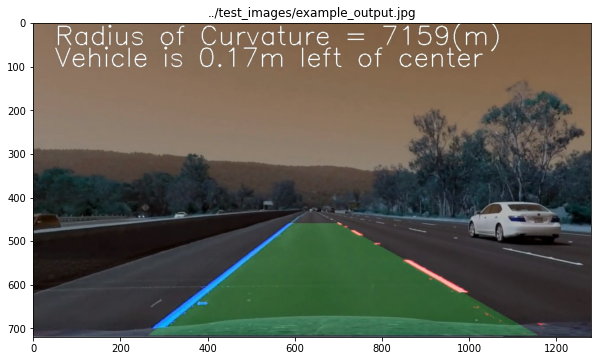

...

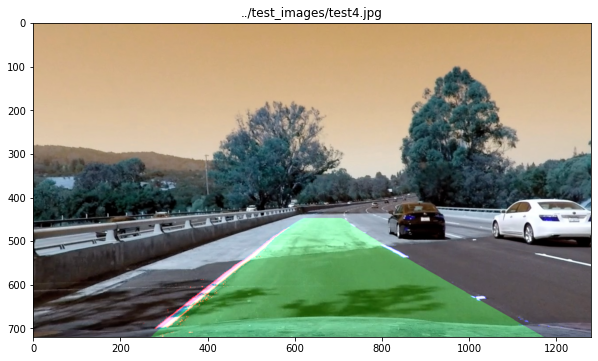

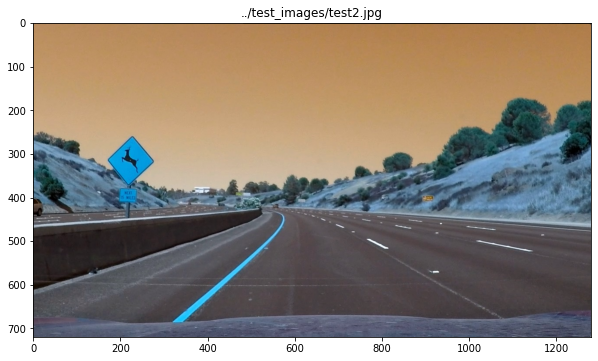

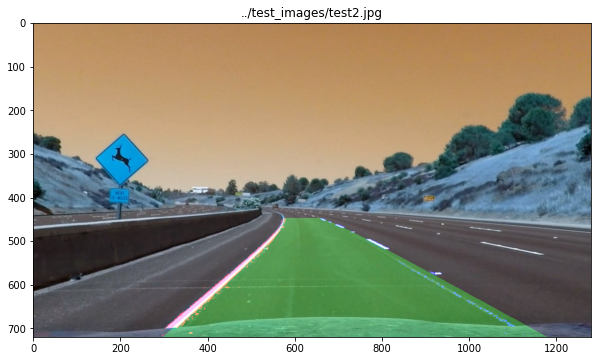

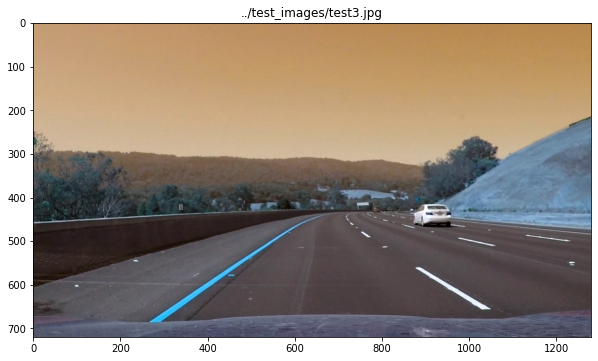

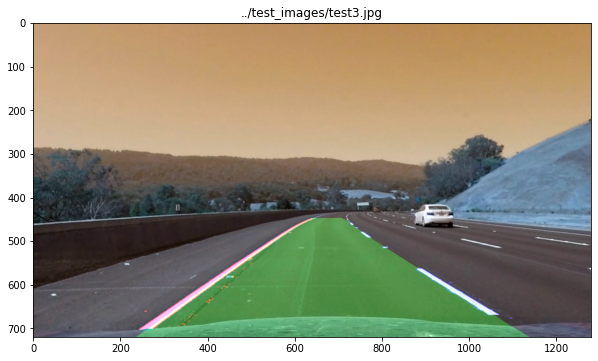

In [441]:
for fname in images:
    img = cv2.imread(fname)

    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    
    markings_img = draw_lanes(top_down, left_poly, right_poly)
    out_img = draw_result(img, markings_img)
    
    plt.figure(figsize=(10, 20))
    plt.title(fname)
    plt.imshow(img)
    plt.show()
    
    plt.figure(figsize=(10, 20))
    plt.title(fname)
    plt.imshow(out_img)
    plt.show()


### Measuring Road Curvature

In [427]:
# thanks to the top-down transformation, 1px in the top-down image
# corresponds to 1cm in real world
mx = 0.01
my = 0.01

def calculate_curvature_for_poly(a, b, y):
    nominator = np.sqrt((1 + (2*a*y + b) ** 2) ** 3)
    denominator = np.abs(2*a)
    return nominator / denominator

def convert_poly_to_worldspace(poly, y_max):
    a = mx / (my ** 2) * poly[0]
    b = mx / my * poly[1]
    return a, b

def calculate_curvature(poly, y_max):
    a, b = convert_poly_to_worldspace(poly, y_max)
    y_worldspace = my * y_max
    return calculate_curvature_for_poly(a, b, y_worldspace)

def average_curvature(left_poly, right_poly, y_max):
    left_curvature = calculate_curvature(left_poly, y_max)
    right_curvature = calculate_curvature(right_poly, y_max)
    return (left_curvature + right_curvature) / 2

def print_curvature(curvature_radius):
    return "Radius of Curvature = {:.0f}(m)".format(curvature_radius)

../test_images/example_output.jpg
Radius of Curvature = 31833(m)


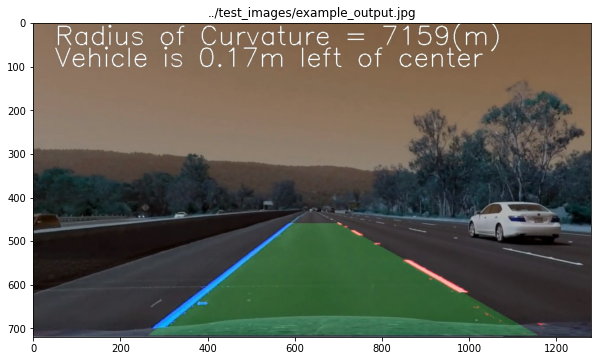

In [428]:
def test_calculate_curvature(fname):
    img = cv2.imread(fname)

    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    

    y_max = top_down.shape[0]
    curvature = average_curvature(left_poly, right_poly, y_max)
    
    print(fname)
    print(print_curvature(curvature))
    
    plt.figure(figsize=(10, 20))
    plt.title(fname)
    plt.imshow(img)
    plt.show()
    

# for fname in images:
#     test_calculate_curvature(fname)

test_calculate_curvature("../test_images/example_output.jpg")

## Calculate off-center distance

In [434]:
def calculate_off_center_distance(left_poly, right_poly, y_eval):
    x_left = left_poly[0] * y_eval**2 + left_poly[1] * y_eval + left_poly[2] - transform_offset_x
    x_right = right_poly[0] * y_eval**2 + right_poly[1] * y_eval + right_poly[2] - transform_offset_x

    off_l = x_left * mx
    off_r = x_right * mx - lane_width * mx
        
    return (off_l + off_r) / 2

def print_off_center_distance(off):
    side = "left" if off > 0 else "right"
    return "Vehicle is {:.2f}m {} of center".format(np.abs(off), side)

In [430]:
def test_off_center_distance(fname):
    img = cv2.imread(fname)

    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    

    y_max = top_down.shape[0]
    off = calculate_off_center_distance(left_poly, right_poly, y_max)
    print(print_off_center_distance(off))
    

# for fname in images:
#     test_off_center_distance(fname)

test_off_center_distance("../test_images/example_output.jpg")

Vehicle is 0.27m left of center


In [431]:
def draw_text(img, offset, curvature):
    curvature_msg = print_curvature(curvature)
    off_msg = print_off_center_distance(offset)

    def draw_line(text, origin):    
        cv2.putText(img, text, origin, cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA) 
        
    draw_line(curvature_msg, (50, 50))
    draw_line(off_msg, (50, 90))

## Image processing pipeline

In [432]:
def process_image(img):
    top_down = transform(img)
    left_poly, right_poly = find_lanes_polynomials(top_down)    

    y_max = top_down.shape[0]
    curvature = average_curvature(left_poly, right_poly, y_max)
    off = calculate_off_center_distance(left_poly, right_poly, y_max)
    
    markings_img = draw_lanes(top_down, left_poly, right_poly)
    out_img = draw_result(img, markings_img)
    draw_text(out_img, off, curvature)
    
    return out_img

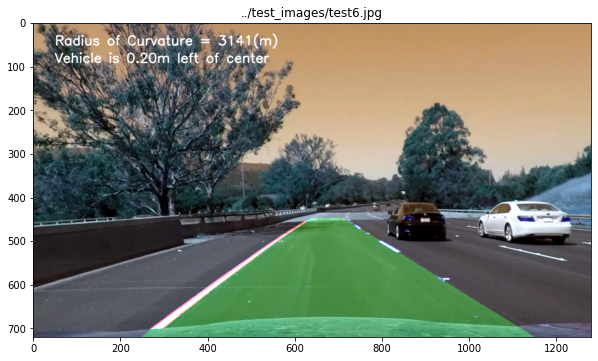

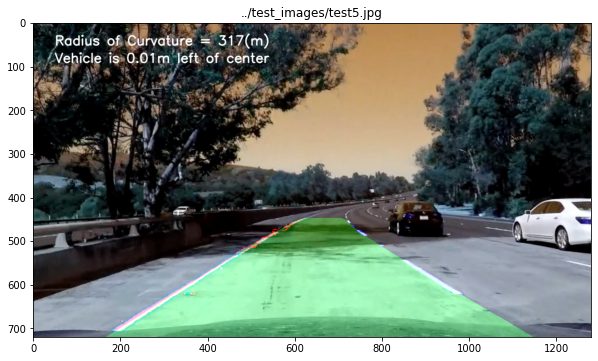

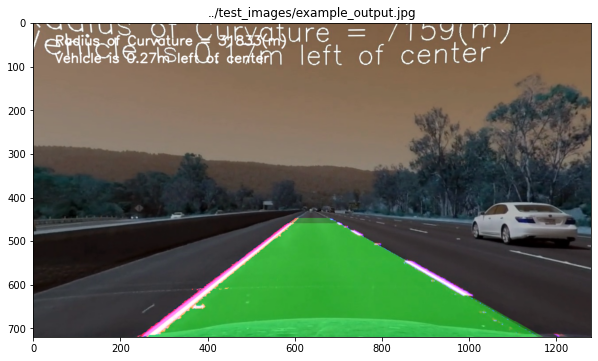

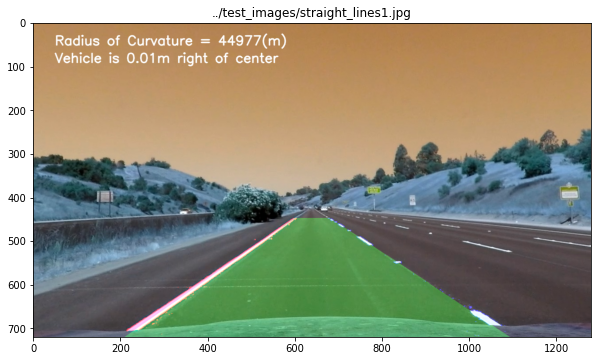

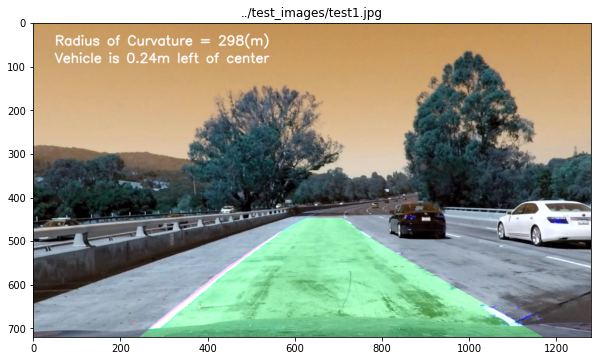

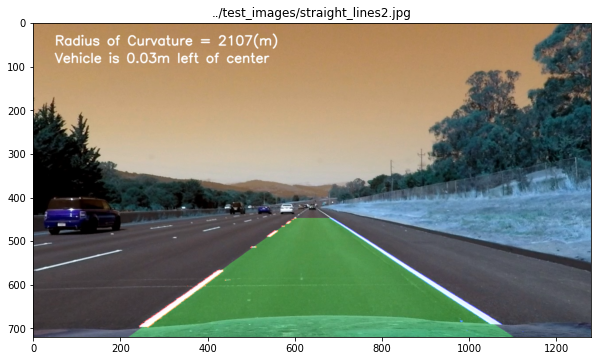

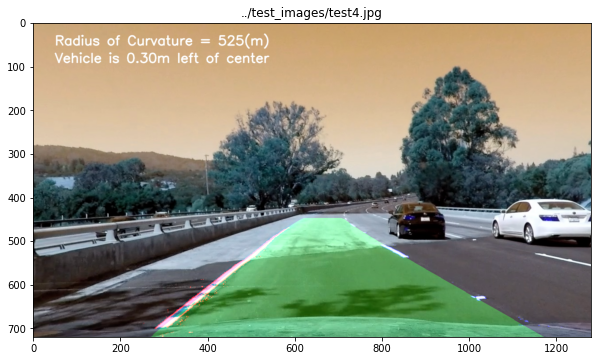

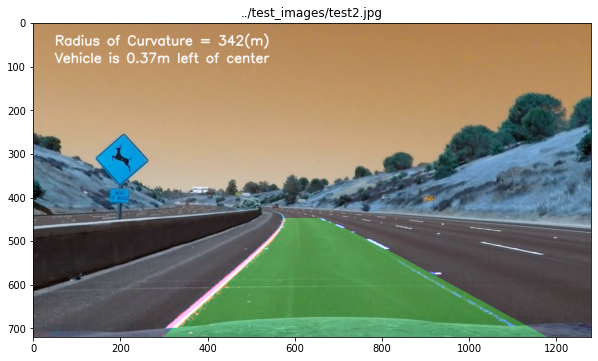

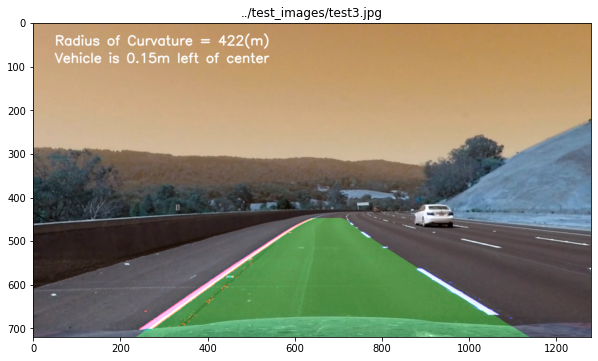

In [435]:
import os

for fname in images:
    img = cv2.imread(fname)
    out = process_image(img)

    plt.figure(figsize=(10, 20))
    plt.title(fname)
    plt.imshow(out)
    plt.show()

    file_name = os.path.basename(fname)
    out_name = "../output_images/{}".format(file_name)
    cv2.imwrite(out_name, out)

## Video processing

In [442]:
from moviepy.editor import VideoFileClip

def process_video(vname):
    out_name = "../output_videos/" + os.path.basename(vname)
    clip = VideoFileClip(vname)
    out_clip = clip.fl_image(process_image)
    %time out_clip.write_videofile(out_name, audio=False)
    
videos = glob.glob("../*.mp4")
for vname in videos:
    process_video(vname)

t:   0%|          | 2/1260 [00:00<01:38, 12.75it/s, now=None]

Moviepy - Building video ../output_videos/project_video.mp4.
Moviepy - Writing video ../output_videos/project_video.mp4



Moviepy - Done !
Moviepy - video ready ../output_videos/project_video.mp4
CPU times: user 7min 51s, sys: 1min 5s, total: 8min 57s
Wall time: 2min 44s


t:   0%|          | 2/485 [00:00<00:35, 13.78it/s, now=None]

Moviepy - Building video ../output_videos/challenge_video.mp4.
Moviepy - Writing video ../output_videos/challenge_video.mp4



Moviepy - Done !
Moviepy - video ready ../output_videos/challenge_video.mp4
CPU times: user 2min 59s, sys: 27.1 s, total: 3min 26s
Wall time: 1min


t:   0%|          | 2/1199 [00:00<01:43, 11.55it/s, now=None]

Moviepy - Building video ../output_videos/harder_challenge_video.mp4.
Moviepy - Writing video ../output_videos/harder_challenge_video.mp4



Moviepy - Done !
Moviepy - video ready ../output_videos/harder_challenge_video.mp4
CPU times: user 7min 51s, sys: 1min 4s, total: 8min 56s
Wall time: 2min 57s
